# This is a pipeline to visualize and analyze the results of CellProfiler on inmunohistochemistry experiments done for PH3


#### TODO:
    - register an a2axai14 line to ARA to separate territories in the ToS

In [34]:
# Import stuff
%load_ext autoreload
%autoreload 2
import os
from utils import data_reader
from utils import plot_utils
from utils import generic_functions as gf
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageOps
import numpy as np
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
#from ggplot import *
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import random

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
# Indicate the animal IDs you want to load
animals_to_load = ['PH301', 'PH302', 'PH303', 'PH304', 'PH305', 'PH306']
# Indicate the main path where all processed data is
processed_data_path = '/mnt/c/Users/herny/Desktop/SWC/Data/Microscopy_Data/Plasticity/PH3_inmuno/Processed_data/'
processed_data_path = '/home/hernandom/data/Microscopy_Data/Plasticity/PH3_inmuno/Processed_data/'

In [3]:
# loop through the animals to get the dataset
df_list = []
for animal_to_load in animals_to_load:
# get paths
    data_path = os.path.join(processed_data_path, animal_to_load)
    # path where the dataframe is (the output of CellProfiler)
    CPoutput_path = os.path.join(data_path, 'Cell_profiler_output/')
    # Import the data
    df_list.append(data_reader.PH3_data_reader(CPoutput_path))

AssertionError: No .csv files found in directory

In [4]:
# concatenate data frames
df = pd.concat(df_list, ignore_index=True)

ValueError: No objects to concatenate

In [6]:
# Create a unique identifier for every instance of measure (manual ROI)
df['group_name'] = df.apply(gf.group_name, axis=1)
df['manual_roi_name'] = df.apply(gf.manual_roi_name, axis=1)

In [13]:
# Add the data path as an attribute of the dataframe
df.attrs['datapath'] = processed_data_path

AttributeError: 'DataFrame' object has no attribute 'attrs'

In [8]:
# save it
df.to_pickle(os.path.join(processed_data_path, 'All_animals_merged_df.pkl'))

In [3]:
# read it
df = pd.read_pickle(os.path.join(processed_data_path, 'All_animals_merged_df.pkl'))
# Add the data path as an attribute of the dataframe because it might have changed computers
df.attrs['datapath'] = processed_data_path

In [7]:
# Rename channels
#df = df.rename(columns={"Children_FinalDots_C2_Count": "drd2_count",
#                        "Children_FinalDots_C3_Count": "drd1_count"})

In [4]:
#OPTIONAL

# Remove some manual ROIs that are not good
g_names_to_remove = ['PH301-1-5-R-Tail']

df = df[~df.manual_roi_name.isin(g_names_to_remove)]

In [5]:
df.attrs

{'datapath': '/home/hernandom/data/Microscopy_Data/Plasticity/PH3_inmuno/Processed_data/'}

***
### Sanity checks on the data
***

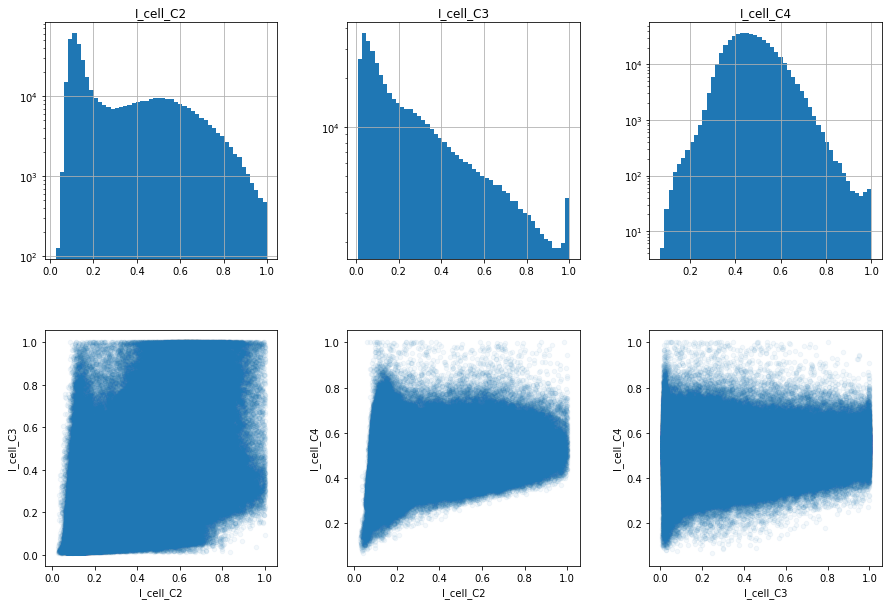

In [7]:
# plot histograms of counts for all the cells
channels = ["I_cell_C2", "I_cell_C3", "I_cell_C4"]
%matplotlib inline
fig, axs = plt.subplots(2, ncols=3, sharey=False, figsize=(15,10))
axs = axs.ravel()
axArr = [axs[0], axs[1], axs[2]]
i = 0
for axis in axArr:
    df.hist(channels[i], ax = axis, bins=50)
    #sns.distplot(df[channels[i]], ax = axis)
    axis.set_yscale("log")
    #axis.set_ylim(0,1000)
    axis.set_title(channels[i])
    i+=1
df.plot.scatter(channels[0], channels[1], ax = axs[3], alpha = 0.05)
df.plot.scatter(channels[0], channels[2], ax = axs[4], alpha = 0.05)
df.plot.scatter(channels[1], channels[2], ax = axs[5], alpha = 0.05)
plt.show()

#### Steps:
- Select SPNs from cellpose
    - Identify PH3 positive cells
    - Select D1, and select D2

Outputs:
- Quantify the proportion of PH3+ D1 and D2
- Locations of PH3 cells with three categories: D1, D2, spn

### - Select SPNs, from cellpose

In [9]:
SPN_indexes_cp = df[df.cellpose_SPN > 0].index.values

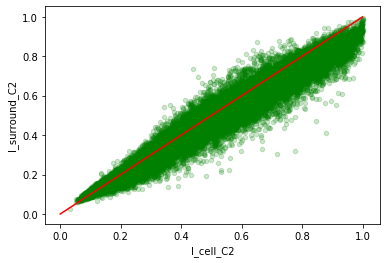

In [12]:
df.loc[SPN_indexes_cp].plot.scatter("I_cell_C2", "I_surround_C2", alpha = 0.2, color='green')
plt.plot([0, 1], [0, 1], '-r')
plt.show()

/home/hernandom/.conda/envs/imageanalysis/lib/python3.7/site-packages/ipykernel_launcher.py:13: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  del sys.path[0]


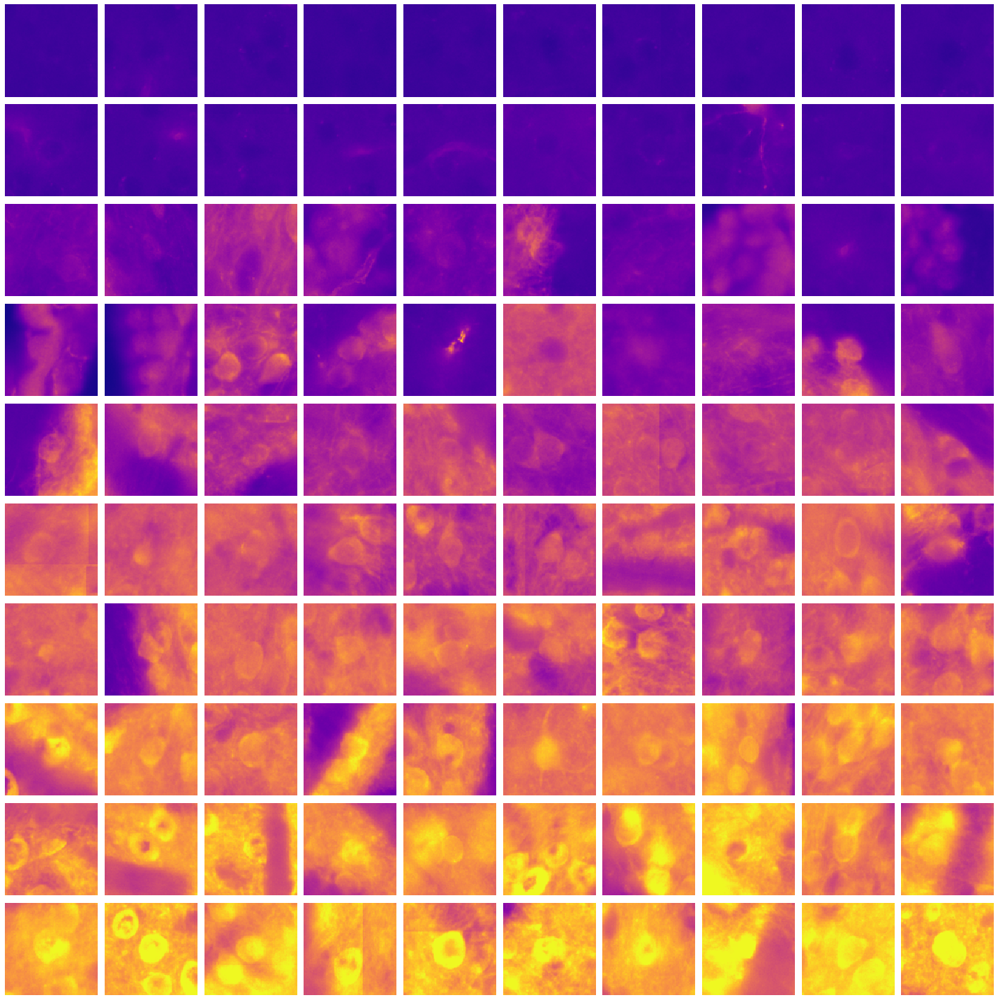

In [13]:
# plot just one channel
channel = 2
ncells = 10
sc = 'I_cell_C' + str(channel)
# plot randomly sets of cells within certain values of channel 2, which is DARPP-32
thresholds = ((0, .1), (.1, .2), (.2, .3), (.3, .4), (.4, .5),
              (.5, .6), (.6, .7), (.7, .8), (.8, 9), (.9, 1))
# get indexes to plot
indexes = gf.get_indexes_by_thr(df.loc[SPN_indexes_cp], sc, thresholds, ncells)
# plot
fig, axs = plt.subplots(len(thresholds), ncells, sharey=False, figsize=(np.ceil(2*ncells), np.ceil(2*len(thresholds))))
fig = plot_utils.plot_channel_of_indexes(fig, axs, indexes, df, channel, window=130, lut='plasma')
fig.show()

In [13]:
# remove low intensity ones
c2_thr = .4
# find indexes of those cells
SPN_indexes_thr = df[df.I_cell_C2 >= c2_thr].index.values
SPN_indexes = np.intersect1d(SPN_indexes_cp, SPN_indexes_thr)
df.loc[SPN_indexes].shape

(29696, 21)

### - Select d1 and d2 separately

#### optics algorithm

In [14]:
from sklearn.cluster import OPTICS

clust = OPTICS(min_samples=1000, xi=.0025, min_cluster_size=.25)
X = df.loc[SPN_indexes][['I_cell_C3', 'I_surround_C3']]
clust.fit(X)

OPTICS(min_cluster_size=0.25, min_samples=1000, xi=0.0025)

/home/hernandom/.conda/envs/imageanalysis/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/home/hernandom/.conda/envs/imageanalysis/lib/python3.7/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/home/hernandom/.conda/envs/imageanalysis/lib/python3.7/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


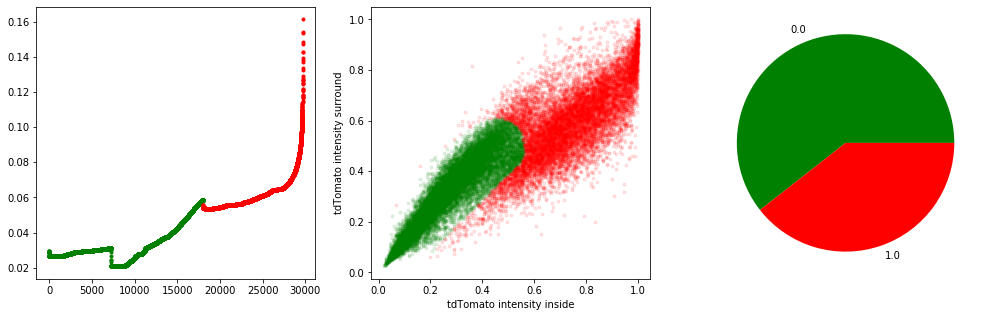

In [15]:
# Automatic clustering does not work as densities are different
# define an horizontal line to cut the reachability plot to define the clusters
hline = 17990
space = np.arange(len(X))
reachability = clust.reachability_[clust.ordering_]
fig, ax = plt.subplots(1, 3, figsize=(17,5))
ax[0].plot(space[space < hline], reachability[space < hline], 'g.')
ax[0].plot(space[space >= hline], reachability[space >= hline], 'r.')
# generate labels based on this
custom_labels = np.zeros(len(X))
custom_labels[clust.ordering_[hline:]] = 1


colors = ['green', 'red']
for klass, color in zip(range(0, 2), colors):
    ax[1].plot(X.iloc[custom_labels == klass, 0], X.iloc[custom_labels == klass, 1],
               color=color, marker='.', alpha=0.1, linewidth=0)
#ax[1].plot(X.iloc[custom_labels == -1, 0], X.iloc[custom_labels == -1, 1], 'k+', alpha=0.1)
ax[1].plot([0, 1], [0, 1], transform=ax[0].transAxes)
ax[1].set_xlabel('tdTomato intensity inside')
ax[1].set_ylabel('tdTomato intensity surround')
# proportion of cells
cellprop = np.unique(custom_labels, return_counts=True)
ax[2].pie(cellprop[1], labels=cellprop[0], colors=colors) 
plt.show()

# define indexes
d1_cl_indexes = X.iloc[custom_labels == 0].index.values
d2_cl_indexes = X.iloc[custom_labels == 1].index.values

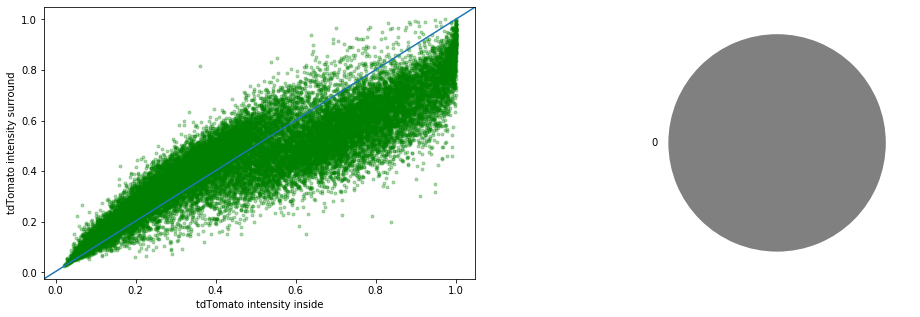

In [48]:
#FOR AUTOMATIC CLUSTERING
# define indexes
d1_cl_indexes = X.iloc[clust.labels_ == 0].index.values
d2_cl_indexes = X.iloc[clust.labels_ == 1].index.values

# clustering results
fig, ax = plt.subplots(1,2, figsize=(17, 5))
colors = ['grey', 'green', 'red']
for klass, color in zip(range(0, 2), colors[1:]):
    ax[0].plot(X.iloc[clust.labels_ == klass, 0], X.iloc[clust.labels_ == klass, 1],
               color=color, marker='.', alpha=0.3, linewidth=0)
ax[0].plot(X.iloc[clust.labels_ == -1, 0], X.iloc[clust.labels_ == -1, 1], 'k+', alpha=0.1)
ax[0].plot([0, 1], [0, 1], transform=ax[0].transAxes)
ax[0].set_xlabel('tdTomato intensity inside')
ax[0].set_ylabel('tdTomato intensity surround')
# proportion of cells
cellprop = np.unique(clust.labels_, return_counts=True)
ax[1].pie(cellprop[1], labels=cellprop[0], colors=colors) 
plt.show()

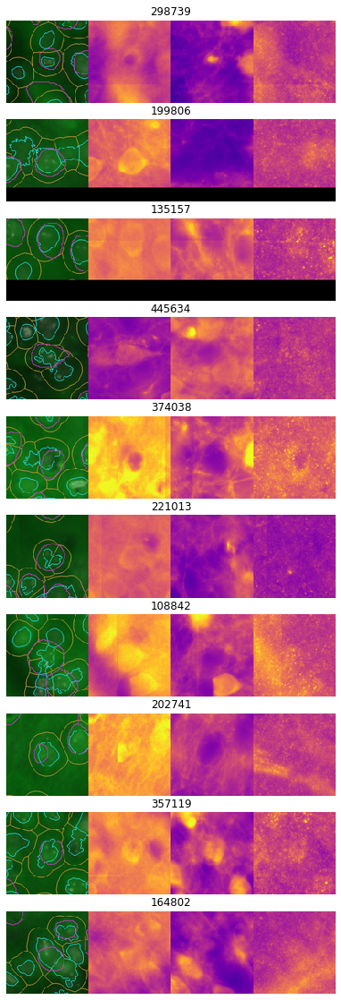

In [14]:
# plot some of the clustered cells
ncells = 10
shuffledIdx = X[clust.labels_ == 0].index.values.copy()
# shuffle them
np.random.shuffle(shuffledIdx)
shuffledIdx = shuffledIdx[0:ncells]
fig = plt.subplots(sharey=False, figsize=(15,np.ceil(2*ncells)))
for counter, i in enumerate(shuffledIdx):
    CellImage = plot_utils.plotPH3Cell(df.loc[i], os.path.join(processed_data_path, df.loc[i].AnimalID), window=130, lut='plasma')
    plt.subplot(ncells, 1, counter+1)
    plt.grid(False)
    plt.axis('off')
    plt.title(str(i))
    plt.imshow(CellImage)

In [17]:
# manual selection of limits to combine with the clustering
c3_dif = 0.95

# find thresholded indexes
d2_thr_indexes = X[(X.I_cell_C3 * c3_dif) >= X.I_surround_C3].index.values
d1_thr_indexes = X[(X.I_cell_C3 / c3_dif) <= X.I_surround_C3].index.values

In [18]:
# combine indexes
d1_SPN_indexes = np.intersect1d(d1_cl_indexes, d1_thr_indexes)
d2_SPN_indexes = np.intersect1d(d2_cl_indexes, d2_thr_indexes)

/home/hernandom/.conda/envs/imageanalysis/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/home/hernandom/.conda/envs/imageanalysis/lib/python3.7/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/home/hernandom/.conda/envs/imageanalysis/lib/python3.7/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


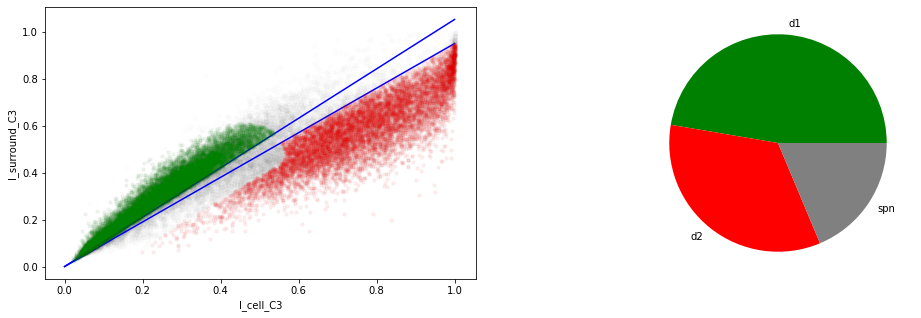

In [19]:
# combination
xs = np.linspace(0, 1, 100)
fig, ax = plt.subplots(1,2, figsize=(17, 5))
X.plot.scatter("I_cell_C3", "I_surround_C3", alpha = 0.01, color ='grey', ax=ax[0])
ax[0].plot(xs, xs * c3_dif, '-', color='b')
ax[0].plot(xs, xs / c3_dif, '-', color='b')
#plt.plot([0, 1], [0, 1], '-b')

ax[0].plot(X.loc[d1_SPN_indexes].I_cell_C3, X.loc[d1_SPN_indexes].I_surround_C3, 'g.', alpha=.05)
ax[0].plot(X.loc[d2_SPN_indexes].I_cell_C3, X.loc[d2_SPN_indexes].I_surround_C3, 'r.', alpha=.05)

# proportion of cells
cellprop = (len(d1_SPN_indexes), len(d2_SPN_indexes), X.shape[0] - (len(d1_SPN_indexes) + len(d2_SPN_indexes)))
ax[1].pie(cellprop, labels=('d1', 'd2', 'spn'), colors=('green', 'red', 'grey')) 
plt.show()

/home/hernandom/.conda/envs/imageanalysis/lib/python3.7/site-packages/ipykernel_launcher.py:12: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  if sys.path[0] == '':


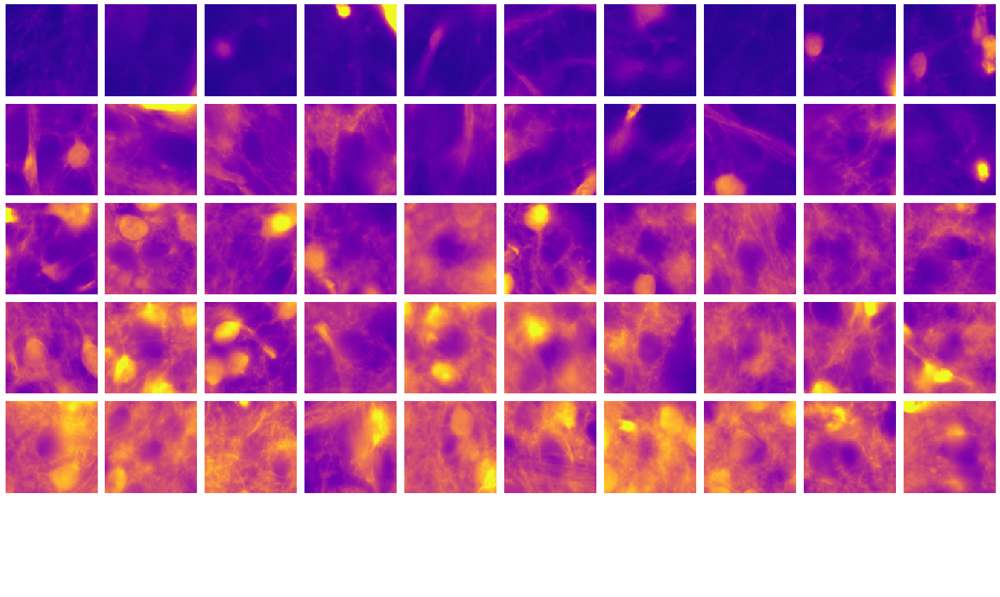

In [20]:
# see the d1 cells
channel = 3
ncells = 10
sc = 'I_cell_C' + str(channel)
# plot randomly sets of cells within certain values 
thresholds = ((0, .1), (.1, .2), (.2, .3), (.3, .4), (.4, .5), (.7,1))
# get indexes to plot
indexes = gf.get_indexes_by_thr(df.loc[d1_SPN_indexes], sc, thresholds, ncells)
# plot
fig, axs = plt.subplots(len(thresholds), ncells, sharey=False, figsize=(np.ceil(2*ncells), np.ceil(2*len(thresholds))))
fig = plot_utils.plot_channel_of_indexes(fig, axs, indexes, df, channel, window=130, lut='plasma')
fig.show()

/home/hernandom/.conda/envs/imageanalysis/lib/python3.7/site-packages/ipykernel_launcher.py:12: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  if sys.path[0] == '':


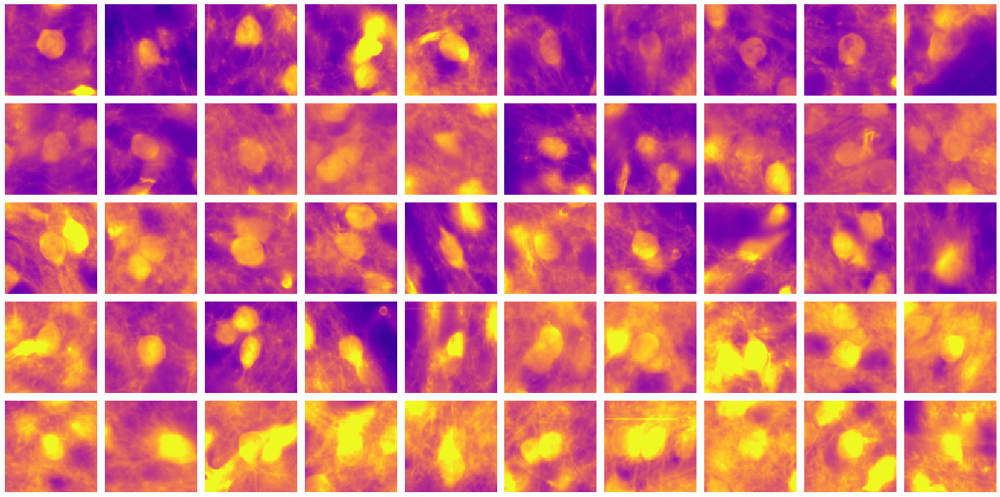

In [21]:
# see the d2 cells
channel = 3
ncells = 10
sc = 'I_cell_C' + str(channel)
# plot randomly sets of cells within certain values of channel 2, which is DARPP-32
thresholds = ((.5, .6), (.6, .7), (.7, .8), (.8, .9), (.9, 1))
# get indexes to plot
indexes = gf.get_indexes_by_thr(df.loc[d2_SPN_indexes], sc, thresholds, ncells)
# plot
fig, axs = plt.subplots(len(thresholds), ncells, sharey=False, figsize=(np.ceil(2*ncells), np.ceil(2*len(thresholds))))
fig = plot_utils.plot_channel_of_indexes(fig, axs, indexes, df, channel, window=130, lut='plasma')
fig.show()

### - Identify PH3+ cells

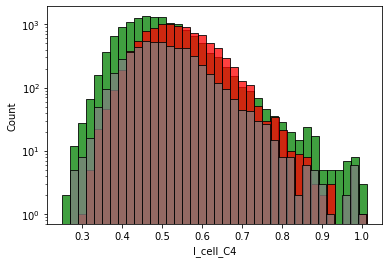

In [20]:
# plot the profiles of the d1 and d2 over the ph3 intensity
splot = sns.histplot(data=df.loc[d1_SPN_indexes], x='I_cell_C4', color='green', binwidth=.02)
sns.histplot(data=df.loc[d2_SPN_indexes], x='I_cell_C4', color='red', binwidth=.02)
SPN_undetermined = SPN_indexes[np.logical_and(~np.in1d(SPN_indexes, d1_SPN_indexes), ~np.in1d(SPN_indexes, d2_SPN_indexes))]
sns.histplot(data=df.loc[SPN_undetermined], x='I_cell_C4', color='grey', binwidth=.02)
splot.set(yscale="log")
plt.show()

FileNotFoundError: [Errno 2] No such file or directory: '/home/hernandom/data/Microscopy_Data/Plasticity/PH3_inmuno/Processed_data/PH301/Cell_profiler_output/PH301_A2A-Ai14_slide-2_slice-1_manualROI-R-Tail_squareROI-17_channel-1_Result_Overlay.tiff'

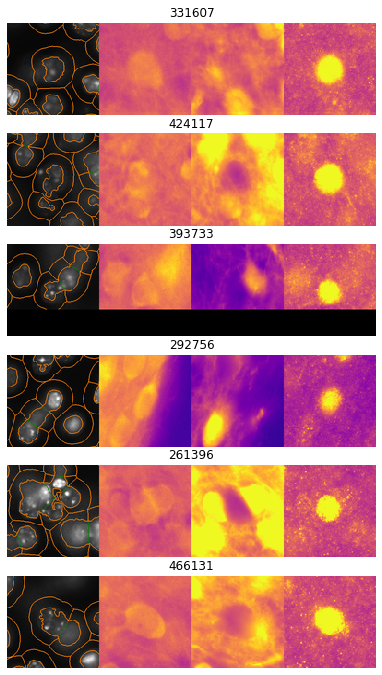

In [111]:
# see the undetermined cells
ncells = 10
shuffledIdx = df.loc[SPN_undetermined][df.loc[SPN_undetermined].I_cell_C4 > 0.9].index.values.copy()
# shuffle them
np.random.shuffle(shuffledIdx)
shuffledIdx = shuffledIdx[0:ncells]
fig = plt.subplots(sharey=False, figsize=(15,np.ceil(2*ncells)))
for counter, i in enumerate(shuffledIdx):
    CellImage = plot_utils.plotPH3Cell(df.loc[i], os.path.join(processed_data_path, df.loc[i].AnimalID),
                                       window=130, lut='plasma')
    plt.subplot(ncells, 1, counter+1)
    plt.grid(False)
    plt.axis('off')
    plt.title(str(i))
    plt.imshow(CellImage)

In [107]:
# THIS NORMALIZATION STEP WILL REMOVE THOSE CELLS THAT ARE NOT SELECTED AS D1 OR D2
# They can get selected back if needed

# Normalize the data as the tdTomato channel might be leaking into the PH3 one
df['I_cell_C4_norm'] = np.nan
df.at[d2_SPN_indexes, 'I_cell_C4_norm'] = df.loc[d2_SPN_indexes].I_cell_C4 - np.mean(df.loc[d2_SPN_indexes].I_cell_C4)
df.at[d1_SPN_indexes, 'I_cell_C4_norm'] = df.loc[d1_SPN_indexes].I_cell_C4 - np.mean(df.loc[d1_SPN_indexes].I_cell_C4)

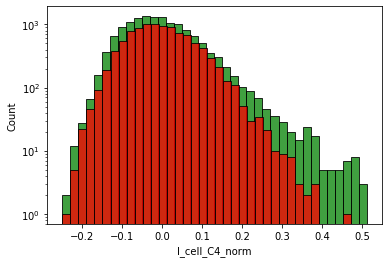

In [22]:
splot = sns.histplot(data=df.loc[d1_SPN_indexes], x='I_cell_C4_norm', color='green', binwidth=.02)
sns.histplot(data=df.loc[d2_SPN_indexes], x='I_cell_C4_norm', color='red', binwidth=.02)
SPN_undetermined = SPN_indexes[np.logical_and(~np.in1d(SPN_indexes, d1_SPN_indexes), ~np.in1d(SPN_indexes, d2_SPN_indexes))]
sns.histplot(data=df.loc[SPN_undetermined], x='I_cell_C4_norm', color='grey', binwidth=.02)
splot.set(yscale="log")
plt.show()

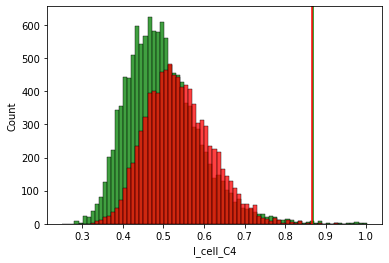

In [46]:
# An alternative is to select those cells that are above X sd
mu_d1 = np.mean(df.loc[d1_SPN_indexes].I_cell_C4)
std_d1 = np.std(df.loc[d1_SPN_indexes].I_cell_C4)
mu_d2 = np.mean(df.loc[d2_SPN_indexes].I_cell_C4)
std_d2 = np.std(df.loc[d2_SPN_indexes].I_cell_C4)

sns.histplot(data=df.loc[d1_SPN_indexes], x='I_cell_C4', color='green', binwidth=.01, kde=False, log_scale=(False,False))
sns.histplot(data=df.loc[d2_SPN_indexes], x='I_cell_C4', color='red', binwidth=.01, kde=False, log_scale=(False,False))
plt.axvline(mu_d1 + 4 * std_d1, color='green')
plt.axvline(mu_d2 + 4 * std_d2, color='red')

In [34]:
mu_d2

0.5390070759578679

In [31]:
np.std(df.loc[d1_SPN_indexes].I_cell_C4)

0.09243861360826088

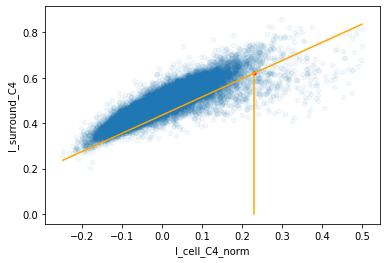

In [82]:
# define parameters for selection of ph3 cells
c4_point = [0.23, 0.62]
c4_slope = .8
xs = np.linspace(np.min(df.I_cell_C4_norm), np.max(df.I_cell_C4_norm), 10)

zero_int = c4_point[1] - c4_point[0] * c4_slope

ys = zero_int + xs * c4_slope

df.loc[SPN_indexes].plot.scatter("I_cell_C4_norm", "I_surround_C4", alpha = 0.050)
plt.plot(c4_point[0], c4_point[1], '.r')
# plt.plot([c4_point[0], np.max(df.I_cell_C4_norm)],
#          [c4_point[1], zero_int + np.max(df.I_cell_C4_norm) * c4_slope],
#          '-', color='orange')
plt.plot([c4_point[0], c4_point[0]],
         [np.min(df.I_surround_C4), c4_point[1]],
         '-', color='orange')
plt.plot(xs, ys, color='orange')
plt.show()

In [83]:
### CLEAN ALL THIS


# apply the selection
# find indexes of PH3 cells
PH3_indexes_all = df[np.logical_and(df.I_cell_C4_norm >= c4_point[0], (df.I_cell_C4_norm * c4_slope + zero_int) >= df.I_surround_C4)].index.values
PH3_indexes = np.intersect1d(SPN_indexes, PH3_indexes_all)
df.loc[PH3_indexes].shape

(246, 23)

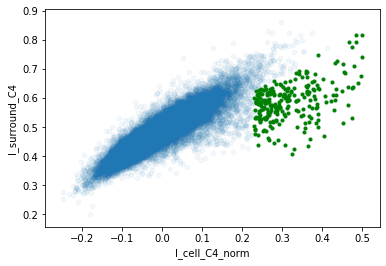

In [85]:
# double check
df.loc[SPN_indexes].plot.scatter("I_cell_C4_norm", "I_surround_C4", alpha = 0.050)
plt.plot(df.loc[PH3_indexes].I_cell_C4_norm, df.loc[PH3_indexes].I_surround_C4, '.g')
plt.show()

/home/hernandom/.conda/envs/imageanalysis/lib/python3.7/site-packages/ipykernel_launcher.py:12: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  if sys.path[0] == '':


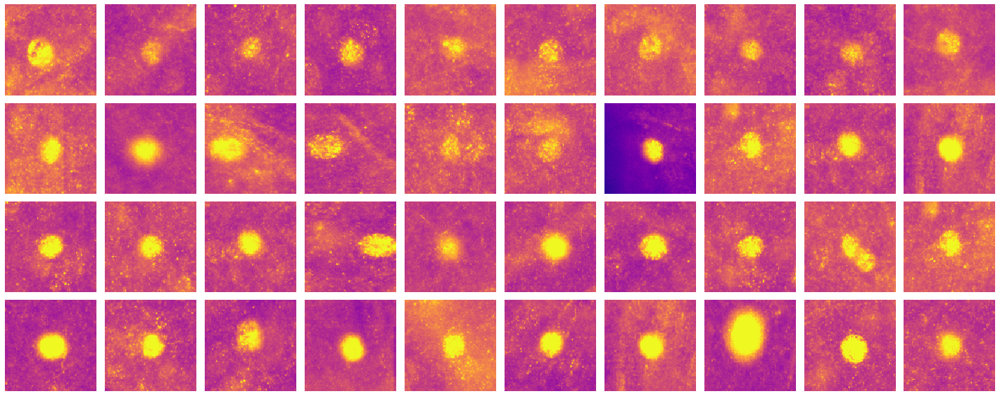

In [86]:
# plot just one channel
channel = 4
ncells = 10
sc = 'I_cell_C' + str(channel)
# plot randomly sets of cells within certain values of channel 2, which is DARPP-32
thresholds = ((.75, .8), (.8, 9), (.9, .95), (.95, 1))
# get indexes to plot
indexes = gf.get_indexes_by_thr(df.loc[PH3_indexes], sc, thresholds, ncells)
# plot
fig, axs = plt.subplots(len(thresholds), ncells, sharey=False, figsize=(np.ceil(2*ncells), np.ceil(2*len(thresholds))))
fig = plot_utils.plot_channel_of_indexes(fig, axs, indexes, df, channel, window=130, lut='plasma')
fig.show()

In [87]:
# total number of PH3 cells
print("There are {} SPN PH3+ cells".format(len(PH3_indexes)))
# total number of d1+ PH3 cells
d1_SPN_PH3_indexes = np.intersect1d(PH3_indexes, d1_SPN_indexes)
print("There are {} d1 + cells".format(len(d1_SPN_PH3_indexes)))
# total number of d2+ PH3 cells
d2_SPN_PH3_indexes = np.intersect1d(PH3_indexes, d2_SPN_indexes)
print("There are {} d2 + cells".format(len(d2_SPN_PH3_indexes)))

# TODO: show enrichment. Normalize by total number of cells selected

There are 246 SPN PH3+ cells
There are 203 d1 + cells
There are 43 d2 + cells


FileNotFoundError: [Errno 2] No such file or directory: '/home/hernandom/data/Microscopy_Data/Plasticity/PH3_inmuno/Processed_data/PH301/Cell_profiler_output/PH301_A2A-Ai14_slide-1_slice-5_manualROI-L-Tail_squareROI-18_channel-1_Result_Overlay.tiff'

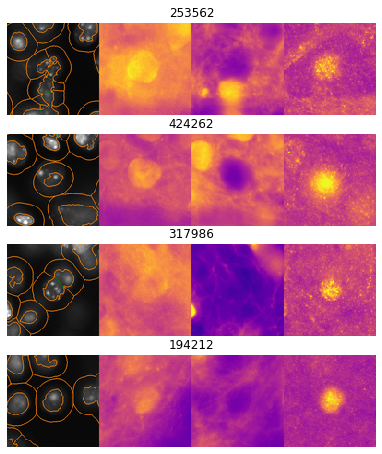

In [88]:
# plot some of the d1 cells
ncells = 10
shuffledIdx = df.loc[d1_SPN_PH3_indexes].index.values.copy()
# shuffle them
np.random.shuffle(shuffledIdx)
shuffledIdx = shuffledIdx[0:ncells]
fig = plt.subplots(sharey=False, figsize=(15,np.ceil(2*ncells)))
for counter, i in enumerate(shuffledIdx):
    CellImage = plot_utils.plotPH3Cell(df.loc[i], os.path.join(processed_data_path, df.loc[i].AnimalID),
                                       window=130, lut='plasma')
    plt.subplot(ncells, 1, counter+1)
    plt.grid(False)
    plt.axis('off')
    plt.title(str(i))
    plt.imshow(CellImage)

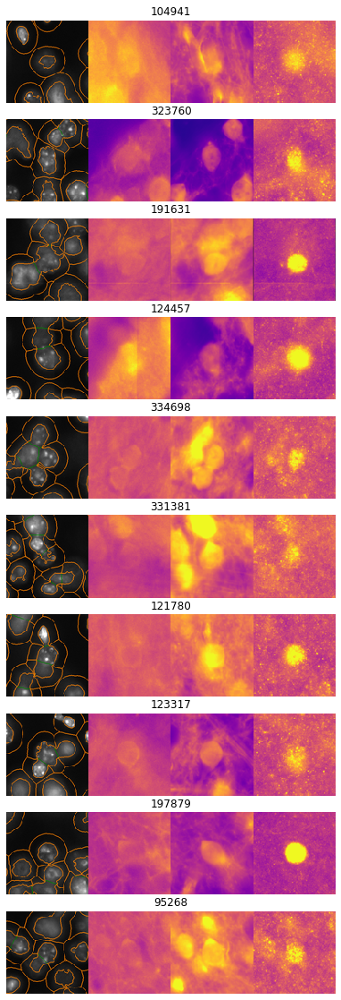

In [89]:
# plot some of the d2 cells
ncells = 10
shuffledIdx = df.loc[d2_SPN_PH3_indexes].index.values.copy()
# shuffle them
np.random.shuffle(shuffledIdx)
shuffledIdx = shuffledIdx[0:ncells]
fig = plt.subplots(sharey=False, figsize=(15,np.ceil(2*ncells)))
for counter, i in enumerate(shuffledIdx):
    CellImage = plot_utils.plotPH3Cell(df.loc[i], os.path.join(processed_data_path, df.loc[i].AnimalID),
                                       window=130, lut='plasma')
    plt.subplot(ncells, 1, counter+1)
    plt.grid(False)
    plt.axis('off')
    plt.title(str(i))
    plt.imshow(CellImage)

### Save results

In [91]:
# save the dataframe with the SPN information to calculate, grouping mice together,
# the ph3 positive cells that are d1 or d2 (normalization would have to be done per mouse)
# create columns
df['SPN'] = 0
df.at[SPN_indexes, 'SPN'] = 1
df['d1'] = 0
df.at[d1_SPN_indexes, 'd1'] = 1
df['d2'] = 0
df.at[d2_SPN_indexes, 'd2'] = 1
df['PH3'] = 0
df.at[PH3_indexes, 'PH3'] = 1
# save indexes for going back if necessary
df['df_indexes'] = df.index.values
df.to_pickle(os.path.join(processed_data_path, '-'.join(animals_to_load) + '_all_cells.pkl'))

In [92]:
# save a dataframe with only the ph3 for the gradient
df_out = df.loc[PH3_indexes]
# create new column
df_out['cell_label'] = 'undetermined'
df_out.at[PH3_indexes, 'cell_label'] = 'spn'
df_out.at[d1_SPN_PH3_indexes, 'cell_label'] = 'd1'
df_out.at[d2_SPN_PH3_indexes, 'cell_label'] = 'd2'
df_out.to_pickle(os.path.join(processed_data_path, '-'.join(animals_to_load) + '_ph3_cells.pkl'))

## Now run Histology_to_ARA repo scripts for registration [and PH3 analysis repo maybe]

In [93]:
# read the dataframe
df = pd.read_pickle(os.path.join(processed_data_path, '-'.join(animals_to_load) + '_all_cells.pkl'))
SPN_indexes = df[df.SPN == 1].index.values
d1_SPN_indexes = df[df.d1 == 1].index.values
d2_SPN_indexes = df[df.d2 == 1].index.values
PH3_indexes = df[df.PH3 == 1].index.values

In [94]:
df.columns

Index(['AnimalID', 'ExperimentalCondition', 'Slide', 'Slice', 'Side', 'AP',
       'ROI', 'ObjectNumber_cells', 'I_cell_C2', 'I_cell_C3', 'I_cell_C4',
       'ObjectNumber_surround', 'I_surround_C2', 'I_surround_C3',
       'I_surround_C4', 'Center_X', 'Center_Y', 'PathName_Channel1',
       'cellpose_SPN', 'group_name', 'manual_roi_name', 'I_cell_C4_norm',
       'I_surround_C4_norm', 'SPN', 'd1', 'd2', 'PH3', 'df_indexes'],
      dtype='object')

In [95]:
sum(df.d2==1)

10095

In [96]:
# calculate the significance of finding these biases for d1
# for each mouse, draw cells randomly from the spn population and compute the p value
all_sub = df[df.SPN==1].groupby(['AnimalID'])['d1', 'd2'].mean()
all_sub = all_sub.reset_index()
all_sub = all_sub.melt(id_vars=["AnimalID"], 
                       var_name="cell type", 
                       value_name="proportion")

/home/hernandom/.conda/envs/imageanalysis/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  This is separate from the ipykernel package so we can avoid doing imports until


In [97]:
ph3_sub = df[df.PH3==1].groupby(['AnimalID'])['d1', 'd2'].mean()
ph3_sub = ph3_sub.reset_index()
ph3_sub = ph3_sub.melt(id_vars=["AnimalID"], 
                       var_name="cell type", 
                       value_name="proportion")

/home/hernandom/.conda/envs/imageanalysis/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """Entry point for launching an IPython kernel.


In [98]:
all_sub['dataset'] = 'all cells'
ph3_sub['dataset'] = 'ph3 cells'
bp_df = pd.concat([all_sub, ph3_sub])

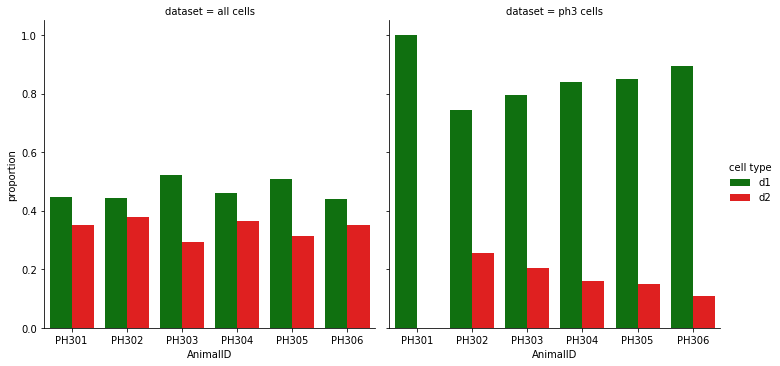

In [99]:
sns.set_palette(['green','red'])
sns.catplot(data=bp_df, x='AnimalID', y='proportion', hue='cell type', col='dataset', kind='bar')
# TODO: add the statistical test
plt.show()

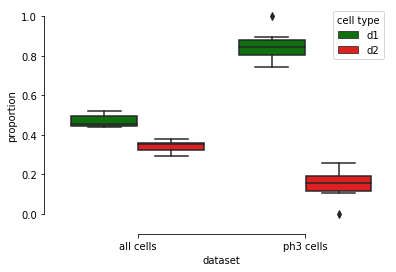

In [100]:
# Draw a nested boxplot
sns.boxplot(x="dataset", y="proportion",
            hue="cell type",# palette=["m", "g"],
            data=bp_df)
sns.despine(offset=10, trim=True)

### explore data

In [62]:
df.loc[i]

AnimalID                                                             PH301
ExperimentalCondition                                             A2A-Ai14
Slide                                                                    1
Slice                                                                    2
Side                                                                     R
AP                                                                    Tail
ROI                                                                     13
ObjectNumber_cells                                                     169
I_cell_C2                                                         0.703324
I_cell_C3                                                         0.768789
I_cell_C4                                                         0.784116
ObjectNumber_surround                                                  169
I_surround_C2                                                     0.634686
I_surround_C3            

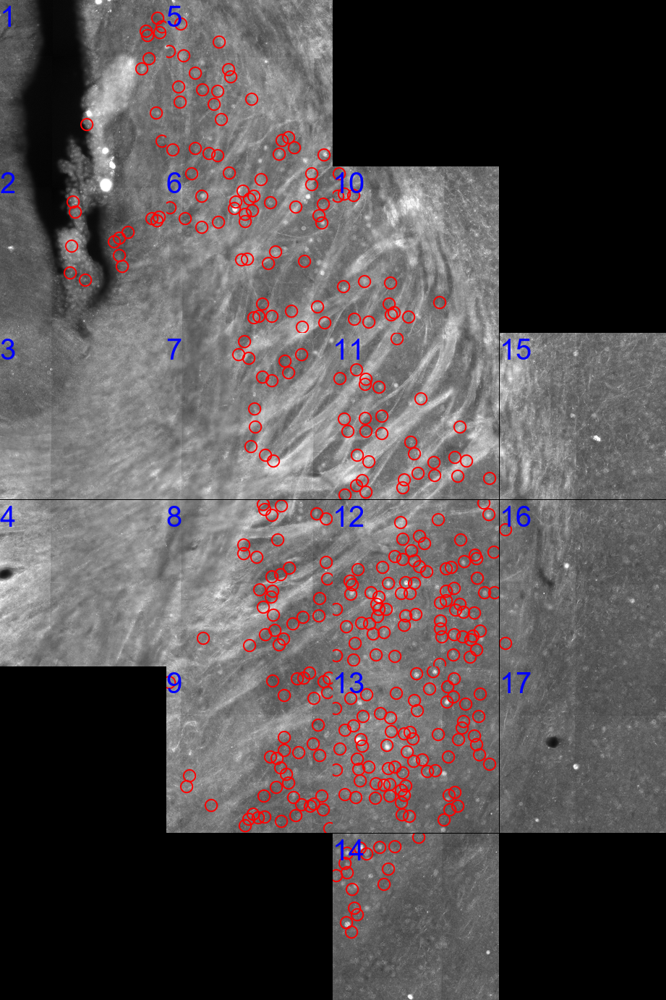

In [19]:
# Concatenate all the ROIs from one manual slice and show the identified cells

# set the conditions to get the data of one of the ROIs
sel_animal = 'PH301'
sel_slide = '1'
sel_slice = '2'
sel_side = 'R'
sel_ap = 'Tail'

sel_mroi_name = '-'.join([sel_animal, sel_slide, sel_slice, sel_side, sel_ap])

# regenerate the picture from the square ROIs
im = plot_utils.get_concat_image_from_rois(df_raw=df, indexes_to_plot=SPN_indexes, sel_mroi_name=sel_mroi_name,
                                           channel=4, cir_radius=80, binning=10, tdtomato_thr=-1)
im

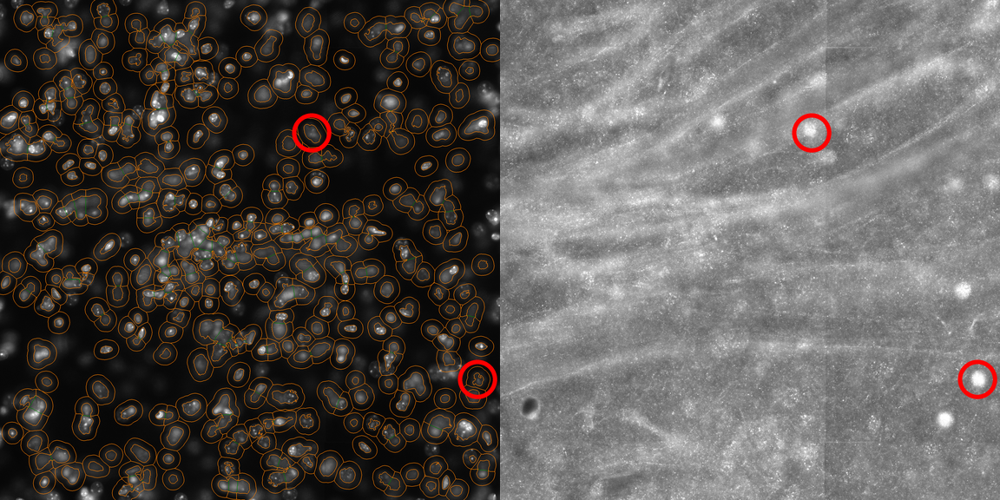

In [15]:
# Circle all cells in a ROI
g_name = 'PH302-2-1-R-Tail-12'
# indicate the size of the circle
cir_radius = 80

im = plot_utils.inspect_cells_in_ROI(df=df, indexes_to_plot=PH3_indexes, g_name=g_name, channels=[4],
                                     cir_radius=cir_radius, binning=4, tdtomato_thr=-1,
                                     plot_cellprofiler=True)
im

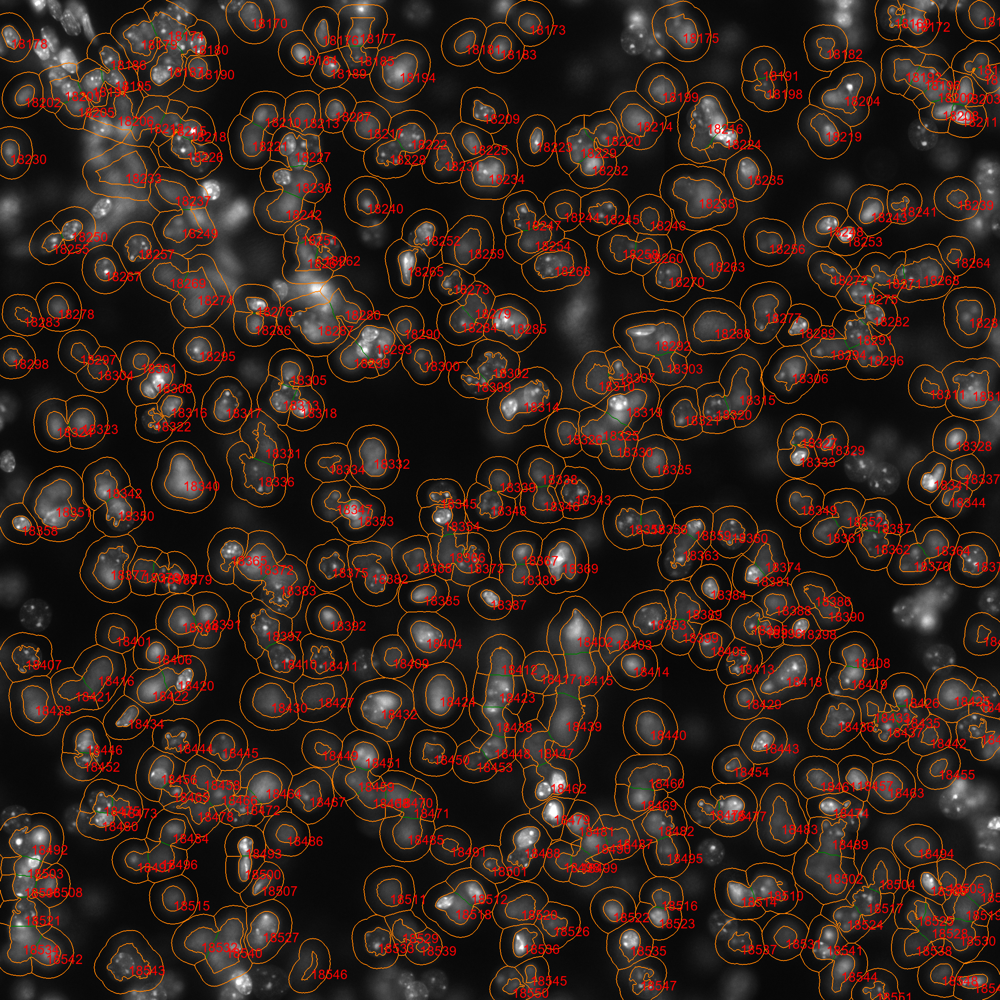

In [18]:
# plot the IDs for every object in a ROI

objects_im = plot_utils.show_object_ids(df, g_name, 30)
objects_im

In [ ]:
CPoutput_path

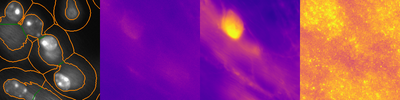

In [17]:
cellid = 18494
plot_utils.plotPH3Cell(df.loc[cellid], df.attrs['datapath'], window=130, lut='plasma')

In [72]:
df.loc[cellid]

AnimalID                                                             PH301
ExperimentalCondition                                             A2A-Ai14
Slide                                                                    1
Slice                                                                    0
Side                                                                     R
AP                                                                    Tail
ROI                                                                     12
ObjectNumber_cells                                                     317
I_cell_C2                                                         0.714854
I_cell_C3                                                         0.801349
I_cell_C4                                                         0.677284
ObjectNumber_surround                                                  317
I_surround_C2                                                     0.721647
I_surround_C3            

### Dumpster

/home/hmvergara/anaconda3/envs/imageanalysis/lib/python3.7/site-packages/seaborn/axisgrid.py:2094: UserWarning: The marginal plotting function has changed to `histplot`, which does not accept the following argument(s): rug.
  warnings.warn(msg, UserWarning)


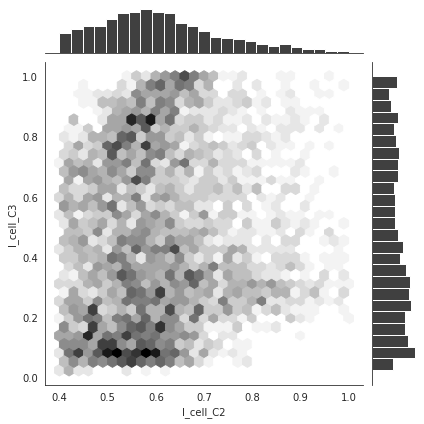

In [15]:
# plot the distribution to select a threshold for which ones are d1 and which ones d2
%matplotlib inline
pal = sns.cubehelix_palette(light=1, as_cmap=True)
with sns.axes_style("white"):
    sns.jointplot(x='I_cell_C2',
                  y='I_cell_C3',
                  data=df.loc[SPN_indexes],
                  kind="hex",
                  #bins='log',
                  # cmap=pal,
                  joint_kws=dict(gridsize=30),
                  color='k',
                  ratio=6,
                  marginal_kws=dict(bins=25, rug=False))


In [ ]:
# define parameters for selection of spn cells
c2_thr = 0.75
c2_dif = 0.8
xs = np.linspace(c2_thr, 1, 100)

df.plot.scatter("I_cell_C2", "I_surround_C2", alpha = 0.05)
plt.plot([0, 1], [0, 1], '-r')
plt.plot([c2_thr, c2_thr], [0, c2_thr * c2_dif], '-', color='orange')
plt.plot(xs, xs * c2_dif, '-', color='orange')

#### manual selection

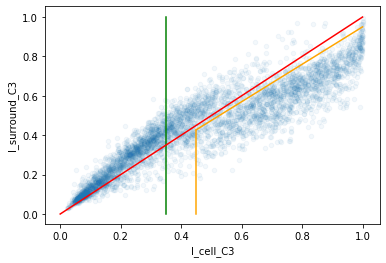

47.026194144838215

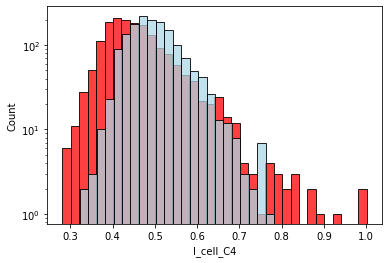

In [56]:
# define parameters for selection of d2 cells
c3_thr_for_d1 = 0.43
c3_thr_for_d2 = 0.65
c3_dif_for_d2 = 0.95

#for KAA706
c3_thr_for_d1 = 0.35
c3_thr_for_d2 = 0.45
c3_dif_for_d2 = 0.95

xs = np.linspace(c3_thr_for_d2, 1, 100)


df.loc[SPN_indexes].plot.scatter("I_cell_C3", "I_surround_C3", alpha = 0.05)
plt.plot([c3_thr_for_d1, c3_thr_for_d1], [0, 1], '-', color='green')
plt.plot([c3_thr_for_d2, c3_thr_for_d2], [0, c3_thr_for_d2 * c3_dif_for_d2], '-', color='orange')
plt.plot(xs, xs * c3_dif_for_d2, '-', color='orange')
plt.plot([0, 1], [0, 1], '-r')
plt.show()

# find their indexes
d1_indexes = df[df.I_cell_C3 <= c3_thr_for_d1].index.values
d2_indexes = df[np.logical_and(df.I_cell_C3 >= c3_thr_for_d2,
                               (df.I_cell_C3 * c3_dif_for_d2) >= df.I_surround_C3)].index.values

# combine them with the SPNs
d1_SPN_indexes = np.intersect1d(SPN_indexes, d1_indexes)
d2_SPN_indexes = np.intersect1d(SPN_indexes, d2_indexes)

# percentage of d2 cells
d2_num = len(d2_SPN_indexes)
d1_num = len(d1_SPN_indexes)
100 * d2_num / (d1_num + d2_num)

In [ ]:
nd2 = sum(df.loc[spn_plus_ph3_idx].MeanI_C3 >= tdtomato_thr)
nd1 = sum(df.loc[spn_plus_ph3_idx].MeanI_C3 < tdtomato_thr)
ax = plt.pie([nd1, nd2], labels=['d1', 'd2'], colors=['cyan', 'red'],
             autopct='%1.1f%%', shadow=False, startangle=90)

In [ ]:
# find which cells are SPNs. Explore the threshold
sc = 'I_cell_C2'
# plot randomly sets of cells within certain values of channel 2, which is DARPP-32
thresholds = ((0, .2), (.2, .4), (.4, .6), (.6, .8), (.8, 1))
#create an empty list
indexes = []
# get the indexes of these cohorts
for tr in thresholds:
    shuffledIdx = df[np.logical_and(df[sc]>=tr[0], df[sc]<tr[1])].index.values.copy()
    # shuffle them
    np.random.shuffle(shuffledIdx)
    # append first
    indexes.append(shuffledIdx[0])
fig = plt.subplots(sharey=False, figsize=(15,np.ceil(2*len(thresholds))))
for counter, i in enumerate(indexes):
    CellImage = plot_utils.plotPH3Cell(df.loc[i], CPoutput_path, window=130, lut='plasma')
    plt.subplot(len(thresholds), 1, counter+1)
    plt.grid(False)
    plt.axis('off')
    plt.title(str(thresholds[counter]) + " - " + str(i))
    plt.imshow(CellImage)

In [ ]:
# circle a cell within its original image
# indicate the index of the cell
index_of_cell = spn_plus_ph3_idx[1]
# indicate the size of the circle
cir_radius = 80

imdir = os.path.join(df.attrs['datapath'],
                     'ROIs--Gce_processed',
                     gf.make_image_name_from_series(df.loc[index_of_cell], channel=4))
# find coordinates of cells
c_x = df.loc[index_of_cell].Center_X
c_y = df.loc[index_of_cell].Center_Y
# define coordinates of circle
cir_coord = (c_x - cir_radius, c_y - cir_radius, c_x + cir_radius, c_y + cir_radius)

im = Image.open(imdir)
im = im.convert('RGB')
#draw = ImageDraw.Draw(im)
plot_utils.draw_ellipse(im, cir_coord, outline ='red', width=20)
im

In [ ]:
# Plot slice for registration. this is very low res

# set the conditions to get the data of one of the ROIs
sel_animal = 'PH301'
sel_slide = '1'
sel_slice = '5'
sel_side = 'R'
conditions = np.logical_and(np.logical_and(df.AnimalID == sel_animal, df.Slide == sel_slide),
                            df.Slice == sel_slice)
# plot the slice for registration
img16 = plot_utils.get_reg_image(df[conditions])
img8 = (np.array(img16)/256).astype('uint8')
img8 = img8/np.max(img8)
im = Image.fromarray(np.uint8(img8*255))
im = ImageOps.autocontrast(im, cutoff=.01)
im
# crop it to the manual ROI

# plot the circles

In [ ]:
np.max(im)